# Process Electron Microscopy (EM) Dataset

Processes the given EM dataset, creating stitched images using LoFTR matching and minimum spanning tree traversal.

In [1]:
%cd ..

import re
import os
import torch
import cv2
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from glob import glob
from copy import deepcopy
from src.loftr import LoFTR, default_cfg
from src.utils.plotting import make_matching_figure
import random

/home/psilling/shared/projects/dip/sources/LoFTR


/home/psilling/anaconda3/envs/loftr/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
overlap = 0.15
max_matches_shown = 50
resolution_ratio = 0.5
target_dir = "../../datasets/TESCAN/2x2/"
out_dir = "../../output/DEMIS/TESCAN/2x2/"

# Check if the target directory exists.
if not os.path.isdir(target_dir):
    raise ValueError(f"Cannot read directory: {target_dir}")

# Read the expected grid size.
dir_name = os.path.basename(os.path.normpath(target_dir))
match = re.match(r"(\d+)x(\d+)", dir_name, flags=re.IGNORECASE)
if match is None:
    raise ValueError(f"Invalid grid specification: {dir_name}'")
grid_size = tuple(int(x) for x in match.groups())  # (rows, columns)
tiles = grid_size[0] * grid_size[1]

# Prepare image paths. Paths are stored in 2D arrays representing sets of image tiles
# separated by grid and slice indices.
image_paths = {}
for path in glob(os.path.join(target_dir, "*.*")):
    # Read grid, tile and slice info.
    match = re.match(r".*g(\d+).t(\d+).s(\d+).*", path, flags=re.IGNORECASE)
    if match is None:
        continue
    tile_str = match.group(2)
    grid_index, tile_index, slice_index = [int(x) for x in match.groups()]

    # Create the slice dictionary and the 2D paths array if not already present.
    path_key = f"{grid_index}_{slice_index}"
    if path_key not in image_paths:
        image_paths[path_key] = np.zeros(grid_size, dtype=object)
    
    # Register the path to its appropriate position.
    row = tile_index // grid_size[1]
    column = tile_index % grid_size[1]
    if row < grid_size[0]:
        image_paths[path_key][row, column] = path

# Validate that the number of paths corresponds to the expected grid size.
for path_key in image_paths.keys():
    if 0 in image_paths[path_key]:
        grid_index, slice_index = path_key.split("_")
        raise ValueError(f"Images at grid index g{int(grid_index):05d} and slice index "
                         f"s{int(slice_index):05d} do not match the expected grid size "
                         f"{grid_size[0]}x{grid_size[1]}.")

image_paths

{'1_10': array([['../../datasets/TESCAN/2x2/dataset3_long_g0001_t0000_s00010.tif',
         '../../datasets/TESCAN/2x2/dataset3_long_g0001_t0001_s00010.tif'],
        ['../../datasets/TESCAN/2x2/dataset3_long_g0001_t0002_s00010.tif',
         '../../datasets/TESCAN/2x2/dataset3_long_g0001_t0003_s00010.tif']],
       dtype=object),
 '1_110': array([['../../datasets/TESCAN/2x2/dataset3_long_g0001_t0000_s00110.tif',
         '../../datasets/TESCAN/2x2/dataset3_long_g0001_t0001_s00110.tif'],
        ['../../datasets/TESCAN/2x2/dataset3_long_g0001_t0002_s00110.tif',
         '../../datasets/TESCAN/2x2/dataset3_long_g0001_t0003_s00110.tif']],
       dtype=object),
 '1_210': array([['../../datasets/TESCAN/2x2/dataset3_long_g0001_t0000_s00210.tif',
         '../../datasets/TESCAN/2x2/dataset3_long_g0001_t0001_s00210.tif'],
        ['../../datasets/TESCAN/2x2/dataset3_long_g0001_t0002_s00210.tif',
         '../../datasets/TESCAN/2x2/dataset3_long_g0001_t0003_s00210.tif']],
       dtype=object),

In [3]:
# Prepare LoFTR for matching using outdoor weights (better than outdoor for EM).
matcher = LoFTR(config=default_cfg)
checkpoint_path = "weights/outdoor_ds.ckpt"
matcher.load_state_dict(torch.load(checkpoint_path)["state_dict"])
matcher = matcher.eval().cuda()

# Prepare image normalisation.
clahe = cv2.createCLAHE(clipLimit=0.5, tileGridSize=(2, 2))

# Setup directories.
os.makedirs(out_dir, exist_ok=True)

In [4]:
def load_img(path, mode=cv2.IMREAD_GRAYSCALE):
    """Loads an image at the given path.

    :param path: Path to the image.
    :param mode: Read mode.
    :return: Image matrix.
    """
    img = cv2.imread(path, mode)
    if img is None:
        raise ValueError(f"Failed to read image: {path}")
    return img


def resize_img(img, resolution_ratio=1.0, divisibility=1):
    """Resize the given image.

    :param img: Image to resize.
    :param resolution_ratio: Resized resolution ratio.
    :param divisibility: Ensures image resolution divisibility by the given number.
    :return: Resized image.
    """
    if resolution_ratio != 1.0 or divisibility != 1:
        new_width = int(round(img.shape[1] * resolution_ratio) // divisibility * divisibility)
        new_height = int(round(img.shape[0] * resolution_ratio) // divisibility * divisibility)
        img = cv2.resize(img, (new_width, new_height))
    return img


def crop_img(img, crop_ratio=0.2, side="r"):
    """Crop the given image according to the specified crop region.

    :param img: Image to crop.
    :param crop_ratio: Crop size as fraction of the original image resolution.
    :param side: From which side to crop (t/b/l/r for top/bottom/left/right).
    :return: Cropped image.
    """
    height, width = img.shape
    if side == "t":
        return img[-round(height * crop_ratio):, :]
    if side == "b":
        return img[:round(height * crop_ratio), :]
    if side == "l":
        return img[:, -round(width * crop_ratio):]
    if side == "r":
        return img[:, :round(width * crop_ratio)]

    raise ValueError(f"Invalid crop side: {side}")


def correct_keypoint_positions(kpts, img_full, img_crop, side="r"):
    """Correct positions of keypoints detected in a cropped image.

    :param kpts: Keypoints array.
    :param img_full: Complete uncropped image.
    :param img_crop: Cropped image.
    :param side: From which side cropping was performed (t/b/l/r for top/bottom/left/right).
    :return: Cropped image.
    """
    height_crop, width_crop = img_crop.shape
    height_full, width_full = img_full.shape

    # Correct keypoint resolution.
    if side == "t" or side == "b":
        resize_factor = width_full / width_crop
    elif side == "l" or side == "r":
        resize_factor = height_full / height_crop
    else:
        raise ValueError(f"Invalid crop side: {side}")
    kpts *= resize_factor

    # Correction keypoint positions for left and top tiles.
    if side == "t":
        kpts[:, 1] += height_full - (height_crop * resize_factor)
    elif side == "l":
        kpts[:, 0] += width_full - (width_crop * resize_factor)

    return kpts


def compute_matches(img1_full, img2_full, horizontal=True, overlap=0.25, resolution_ratio=0.5):
    """
    Compute matches between a pair of images using LoFTR.

    :param img1_full: Uncropped left/top image.
    :param img2_full: Uncropped light/bottom image.
    :param horizontal: Whether the images are horizontally aligned.
    :param overlap: Maximum expected overlap between neighboring tiles.
    :param resolution_ratio: Resolution to use during feature matching.
    :return: Detected matches and the corresponding confidence scores.
    """    
    # Get cropped images based on expected overlap.
    if horizontal:
        img1_position = "l"
        img2_position = "r"
    else:
        img1_position = "t"
        img2_position = "b"

    img1 = crop_img(img1_full, overlap, img1_position)
    img2 = crop_img(img2_full, overlap, img2_position)

    # Resize the images. Note that LoFTR requires the final resolution
    # to be divisible by 8.
    img1 = resize_img(img1, resolution_ratio, divisibility=8)
    img2 = resize_img(img2, resolution_ratio, divisibility=8)
    
    # Create float batch tensors on the GPU.
    img1_batch = torch.from_numpy(img1)
    img1_batch = img1_batch.reshape(1, 1, *img1_batch.shape).cuda() / 255.0
    img2_batch = torch.from_numpy(img2)
    img2_batch = img2_batch.reshape(1, 1, *img2_batch.shape).cuda() / 255.0

    # Run inference with LoFTR to get match predictions.
    batch = {"image0": img1_batch, "image1": img2_batch}
    with torch.no_grad():
        matcher(batch)
        matches1 = batch["mkpts0_f"].cpu().numpy()
        matches2 = batch["mkpts1_f"].cpu().numpy()
        conf = batch["mconf"].cpu().numpy()

    # Convert keypoint coordinates to full image space.
    matches1 = correct_keypoint_positions(matches1, img1_full, img1, img1_position)
    matches2 = correct_keypoint_positions(matches2, img2_full, img2, img2_position)
    
    return matches1, matches2, conf

def estimate_transformation(matching_result, ransac_threshold=5.0):
    """Estimate image tile transformation based on the corresponding matching result.

    :param matching_result: Matching result to process.
    :param ransac_threshold: Threshold to use for the underlying RANSAC algorithm.
    :return: Estimated transformation.
    """
    H, _ = cv2.findHomography(matching_result.matches2, matching_result.matches1, cv2.RANSAC, ransac_threshold)
    matching_result.transformation = matching_result.parent_transformation.dot(H)

def stitch_tile_orig(combined_image, matching_result):
    img_tile = matching_result.img
    estimate_transformation(matching_result)

    width = combined_image.shape[1] + 2 * img_tile.shape[1]
    height = combined_image.shape[0] + 2 * img_tile.shape[0]
    width_offset = img_tile.shape[1]
    height_offset = img_tile.shape[0]

    # The result is translated to the middle of a larger image to avoid cropping.
    M = np.array([[1, 0, width_offset], [0, 1, height_offset], [0, 0, 1]]).dot(matching_result.transformation)
    img_result = cv2.warpPerspective(img_tile, M, (width, height), flags=cv2.INTER_NEAREST)
    img_result[height_offset:combined_image.shape[0] + height_offset,
               width_offset:combined_image.shape[1] + width_offset] = combined_image

    # Crop black edges.
    y_nonzero, x_nonzero = np.nonzero(img_result)
    img_result = img_result[np.min(y_nonzero):np.max(y_nonzero), np.min(x_nonzero):np.max(x_nonzero)]

    return img_result

def stitch_tile(combined_image, matching_result):
    img_tile = matching_result.img
    estimate_transformation(matching_result)

    width = combined_image.shape[1] + img_tile.shape[1]
    height = combined_image.shape[0] + img_tile.shape[0]
    width_offset = 0
    height_offset = 0

    # The result is translated to the middle of a larger image to avoid cropping.
    M = matching_result.transformation
    img_result = cv2.warpPerspective(img_tile, M, (width, height), flags=cv2.INTER_NEAREST)
    img_result[height_offset:combined_image.shape[0] + height_offset,
               width_offset:combined_image.shape[1] + width_offset] = combined_image

    # Crop black edges.
    y_nonzero, x_nonzero = np.nonzero(img_result)
    img_result = img_result[np.min(y_nonzero):np.max(y_nonzero), np.min(x_nonzero):np.max(x_nonzero)]

    return img_result

In [5]:
from dataclasses import dataclass, field
from queue import PriorityQueue

class MatchingResult:
    def __init__(self, parent_transformation, img, matches1, matches2, position):
        self.parent_transformation = parent_transformation
        self.img = img
        self.matches1 = matches1
        self.matches2 = matches2
        self.position = position
        self.transformation = None


@dataclass(order=True)
class WeightedMatchingResult:
    weight: float
    matching_result: MatchingResult=field(compare=False)

Current position: (0, 0)
Unprocessed neighbors: [(1, 0), (0, 1)]
Neighbor (1, 0) queued with weight -2419.3525390625
Selected tile (1, 0) as best.
Current position: (1, 0)
Unprocessed neighbors: [(1, 1)]
Neighbor (1, 1) queued with weight -3321.187255859375
Selected tile (1, 1) as best.
Current position: (1, 1)
Unprocessed neighbors: [(0, 1)]


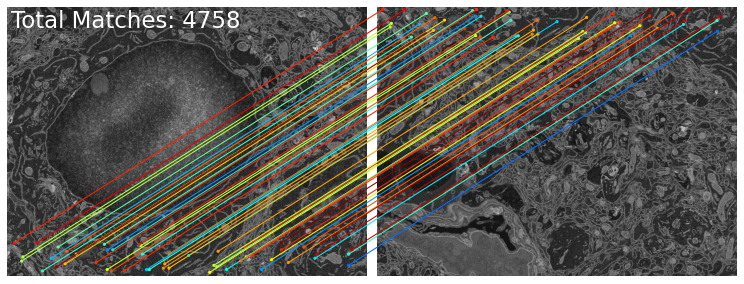

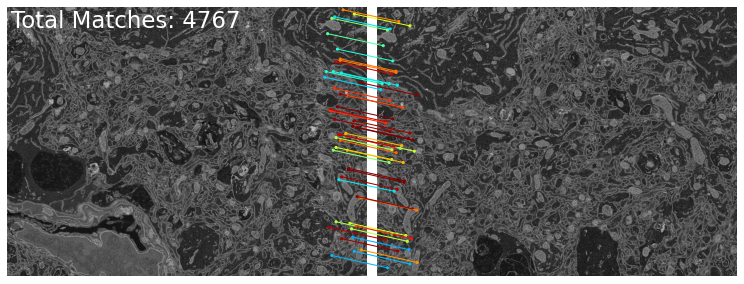

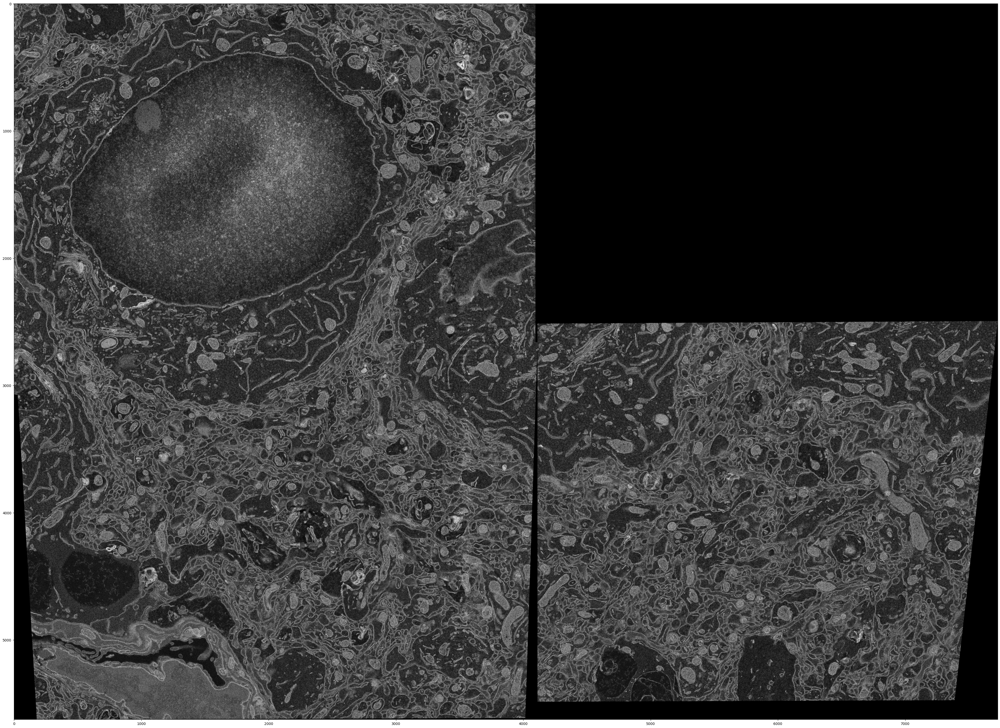

In [9]:
# Stitch image tiles in each grid. A minimum spanning tree (MST) is constructed using
# Jarník's algorithm to estimate the best stitching order for each grid.
for tile_paths in image_paths.values():
    tile_queue = PriorityQueue()
    stitched_image = None

    # Find LoFTR keypoint matches between each pair of adjacent image tiles.
    # The algorithm starts from the middle of the grid so that any
    # misalignments are distributed as evenly as possible.
    stitched_count = 0
    position = (grid_size[0] // 2, grid_size[1] // 2)
    position = (0, 0)
    tile_states = np.zeros(grid_size, dtype=bool)
    tile_states[position] = True
    transformation = np.identity(3)
    while stitched_count < tiles:
        if stitched_image is not None:
            # All tiles neighboring the already processed ones should be already weighted.
            # Process the best one (unless already stitched).
            best_tile = tile_queue.get().matching_result
            while tile_states[best_tile.position]:
                print(f"Skipping tile {best_tile.position}.")
                best_tile = tile_queue.get().matching_result

            print(f"Selected tile {best_tile.position} as best.")
            stitched_image = stitch_tile(stitched_image, best_tile)

            stitched_count += 1
            tile_states[best_tile.position] = True
            position = best_tile.position
            transformation = best_tile.transformation

        # Add unprocessed neighboring tiles.
        neighbors = []
        row, column = position
        if row > 0 and not tile_states[row - 1, column]:
            neighbors.append((row - 1, column))
        if row < grid_size[0] - 1 and not tile_states[row + 1, column]:
            neighbors.append((row + 1, column))
        if column > 0 and not tile_states[row, column - 1]:
            neighbors.append((row, column - 1))
        if column < grid_size[1] - 1 and not tile_states[row, column + 1]:
            neighbors.append((row, column + 1))
        print(f"Current position: {position}")
        print(f"Unprocessed neighbors: {neighbors}")

        # Match the current image to its neighbors.
        img = None
        tile_path = tile_paths[position]
        for neighbor_position in neighbors:
            if neighbor_position == (0, 1) and position == (0, 0):
                continue
            # Load the images.
            neighbor_path = tile_paths[neighbor_position]
            if img is None:
                img = load_img(tile_path)
                if stitched_image is None:
                    stitched_image = img
                    stitched_count += 1
                    tile_states[position] = True
            img_neigh = load_img(neighbor_path)

            # Compute matches. First image must always be the top or left one.
            horizontal = (neighbor_position[0] == row)
            swapped = (neighbor_position[0] < row) or (neighbor_position[1] < column)            
            if swapped:
                continue
                matches2, matches1, conf = compute_matches(img_neigh, img, horizontal,
                                                           overlap, resolution_ratio)
            else:
                matches1, matches2, conf = compute_matches(img, img_neigh, horizontal,
                                                           overlap, resolution_ratio)

            # Make a matching figure.
            match_samples = random.sample(range(0, len(matches1)), min(max_matches_shown, len(matches1)))
            color = cm.jet(conf[match_samples])
            text = [f"Total Matches: {len(matches1)}"]
            fig = make_matching_figure(img, img_neigh, matches1[match_samples],
                                       matches2[match_samples], color, text=text)
            out_path = os.path.join(out_dir, f"g{grid_index:04d}",
                                    f"{neighbor_position}_matches.png")
            os.makedirs(os.path.dirname(out_path), exist_ok=True)
            fig.savefig(out_path)
            
            # Ensure there is enough matches.
            if len(matches1) < 4:
                print(f"Not enough matches found for image pair: {(tile_path, neighbor_path)}")
                continue

            matching_result = MatchingResult(
                parent_transformation=transformation,
                img=img_neigh,
                matches1=matches1,
                matches2=matches2,
                position=neighbor_position
            )

            # Calculate weight as the negative sum of squared confidence scores.
            weight = -(conf**2).sum()

            # Queue up the neighbor.
            tile_queue.put(WeightedMatchingResult(weight, matching_result))
            print(f"Neighbor {neighbor_position} queued with weight {weight}")
        if position == (1, 1):
            break
    break

fig = plt.figure(figsize=(50, 50))
plt.imshow(stitched_image, cmap="gray")
out_path = os.path.join(out_dir, f"sitched_image.png")
os.makedirs(os.path.dirname(out_path), exist_ok=True)
fig.savefig(out_path)